<a href="https://colab.research.google.com/github/MayurLukka/Mobile_PriceRange_Prediction/blob/main/Mobile_PriceRange_Predection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Mobile-Price-Range-Prediction**

### **In the competitive mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phone(eg:- RAM, Internal Memory, etc) and its selling price. In this problem, we do not have to predict the actual price but a price range indicating how high the price is.**

**Project Type** - Classification (Mobile price prediction)

**Contribution** - Individual

# **Let's Begin !**

# **GitHub Link**

https://github.com/MayurLukka/Mobile_PriceRange_Prediction

# **Data Description -**

Battery_power - Total energy a battery can store in one time measured in mAh

Blue - Has bluetooth or not

Clock_speed - speed at which microprocessor executes instructions

Dual_sim - Has dual sim support or not

Fc - Front Camera mega pixels

Four_g - Has 4G or not

Int_memory - Internal Memory in Gigabytes

M_dep - Mobile Depth in cm

Mobile_wt - Weight of mobile phone

N_cores - Number of cores of processor

Pc - Primary Camera mega pixels

Px_heig Px_height - Pixel Resolution Height

Px_width - Pixel Resolution Width

Ram - Random Access Memory in Mega Bytes

Sc_h - Screen Height of mobile in cm

Sc_w - Screen Width of mobile in cm

Talk_time - longest time that a single battery charge will last

Three_g - Has 3G or not

Touch_screen - Has touch screen or not

Wifi - Has wifi or not

Price_range - This is the target variable with value of 0(low cost), 1 (medium cost), 2(high cost) and 3(very high cost).

# **Import and installing models**

In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# import lime
# import lime.lime_tabular
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import  KNeighborsClassifier
from sklearn.ensemble  import  BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble  import  VotingClassifier
from sklearn.neighbors import  KNeighborsClassifier
from sklearn.svm import SVC
import xgboost
from sklearn.ensemble import StackingClassifier


# **Dataset Loading**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!pip3 install lime

In [ ]:
from google.colab import files

In [ ]:
uploaded = files.upload()

Saving data_mobile_price_range.csv to data_mobile_price_range.csv


In [ ]:
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(name=fn, length=len(uploaded[fn])))

User uploaded file "data_mobile_price_range.csv" with length 122403 bytes


In [ ]:
df=pd.read_csv("data_mobile_price_range.csv")

In [ ]:
import pandas as pd

# **Defination**

In [ ]:
def ML(model):

  model.fit(X_train_scaled,y_train)
  y_pred_train = model.predict(X_train_scaled)
  y_pred_test = model.predict(X_test_scaled)

  # Mean cross val score

  from sklearn.model_selection import cross_val_score
  scores = cross_val_score(model,X_scaled, y, scoring = 'accuracy', cv = 5)
  print(f'cv_mean_score={np.mean(scores)}')

  print(f'\n')

  # Cross validate

  from sklearn.model_selection import cross_validate
  scores = cross_validate(model,X_scaled, y, scoring = 'accuracy', cv = 5, return_train_score=True,return_estimator=True,verbose = 10)
  print(f'Cross validate scores={scores}')

  print(f'\n')
  # Class

  #print(f'Model classes = {model.classes_}')

  # Classification Report
  print(f'\n')

  from sklearn.metrics import classification_report
  print(f'Classification Report = \n {classification_report(y_pred_test, y_test)}')


# **Data Description**

In [ ]:
cat_df = df[['blue','dual_sim','four_g','three_g','touch_screen','wifi']]
num_df = df[['battery_power','clock_speed', 'fc','int_memory','m_dep','mobile_wt','n_cores','pc','px_height','px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


In [ ]:
df.shape

(2000, 21)

In [ ]:
df.corr()['price_range']

battery_power    0.200723
blue             0.020573
clock_speed     -0.006606
dual_sim         0.017444
fc               0.021998
four_g           0.014772
int_memory       0.044435
m_dep            0.000853
mobile_wt       -0.030302
n_cores          0.004399
pc               0.033599
px_height        0.148858
px_width         0.165818
ram              0.917046
sc_h             0.022986
sc_w             0.038711
talk_time        0.021859
three_g          0.023611
touch_screen    -0.030411
wifi             0.018785
price_range      1.000000
Name: price_range, dtype: float64

In [ ]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

<AxesSubplot:xlabel='price_range', ylabel='Density'>

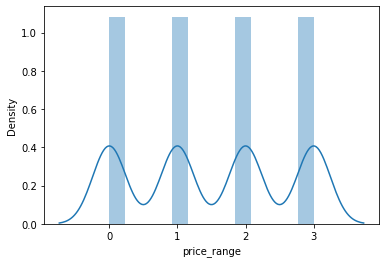

In [ ]:
sns.distplot(df['price_range'])

# **EDA**


In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 22.6 MB 21.7 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 12.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.8/679.8 KB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 KB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 118.7 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=345010 sha256=0e38623c80358236196f1067570f942d5e23ba98ee7fed88b76369291928e28e
  Stored in directory: /tmp/pip-ephem-wheel-cache-a7i734xi/wheels/43/c8/f4/c0ebc32d7f20fe89d0e92d90eaeef5f0c0594a89b6bc16b352


In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df,explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

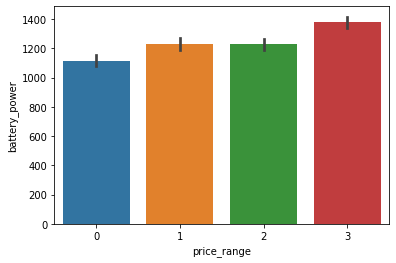

In [ ]:
sns.barplot(x=df['price_range'],y=df['battery_power'])
plt.xticks(rotation = 'horizontal')
plt.show()

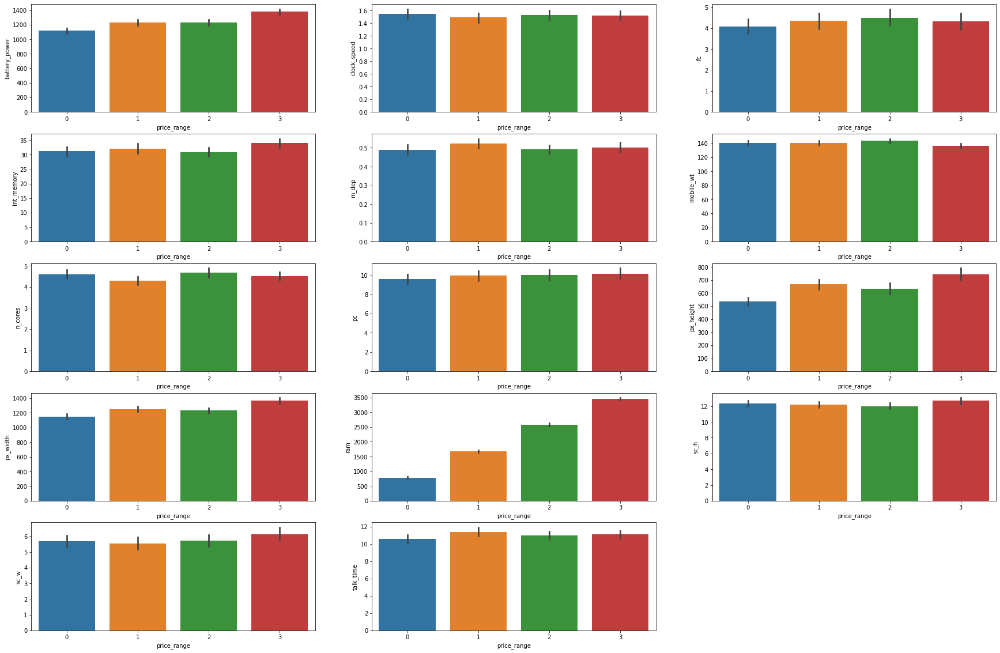

In [ ]:
plt.figure(figsize=(30,20))
j = 1
for i in num_df.columns:
  plt.subplot(5,3,j)
  sns.barplot(x=df['price_range'],y=df[i])
 
  j=j+1


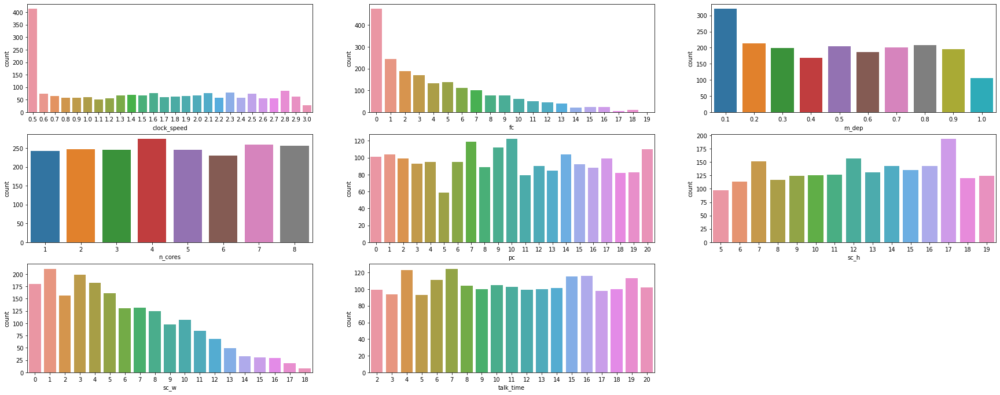

In [ ]:
count_df = df[['clock_speed', 'fc','m_dep','n_cores','pc','sc_h', 'sc_w', 'talk_time']]
plt.figure(figsize=(30,20))
j = 1
for i in count_df.columns:
  plt.subplot(5,3,j)
  sns.countplot(x=df[i])
 
  j=j+1
     

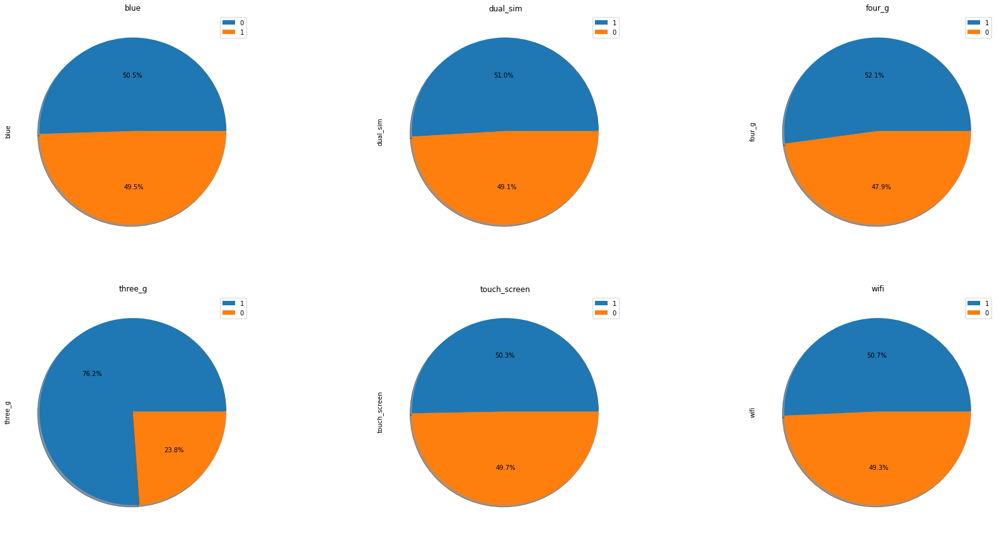

In [ ]:
plt.figure(figsize=(30,15))
j=1
for i in cat_df.columns:
  plt.subplot(2, 3, j)
  j+=1
  cat_df[i].value_counts().plot.pie (autopct='%1.1f%%',shadow=True,labeldistance=None)
  plt.legend()
# plt.ylabel('')
  plt.title(i)


# **Data preprocessing**

In [ ]:
X = df.drop(columns= 'price_range')
y = df['price_range'] 
     

<AxesSubplot:ylabel='Density'>

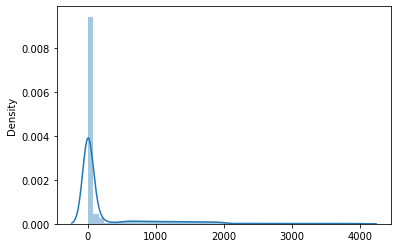

In [ ]:
sns.distplot(X)

In [ ]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer

In [ ]:
from sklearn.preprocessing import PowerTransformer
jhon = PowerTransformer(method='yeo-johnson')

x_transformed = jhon.fit_transform(X)


In [ ]:
x_transformed

array([[-0.88210237, -0.9900495 ,  0.86485888, ..., -1.78686097,
        -1.00601811,  0.98609664],
       [-0.44331856,  1.0100505 , -1.34967629, ...,  0.55964063,
         0.99401789, -1.01409939],
       [-1.63133458,  1.0100505 , -1.34967629, ...,  0.55964063,
         0.99401789, -1.01409939],
       ...,
       [ 1.45846719, -0.9900495 , -0.70668067, ...,  0.55964063,
         0.99401789, -1.01409939],
       [ 0.65114927, -0.9900495 , -0.70668067, ...,  0.55964063,
         0.99401789,  0.98609664],
       [-1.78590061,  1.0100505 ,  0.65810309, ...,  0.55964063,
         0.99401789,  0.98609664]])

<AxesSubplot:ylabel='Density'>

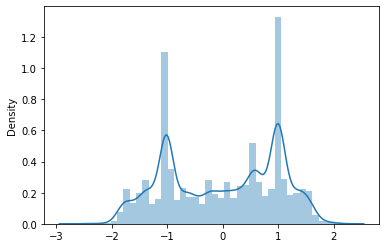

In [ ]:
sns.distplot(x_transformed)

<AxesSubplot:>

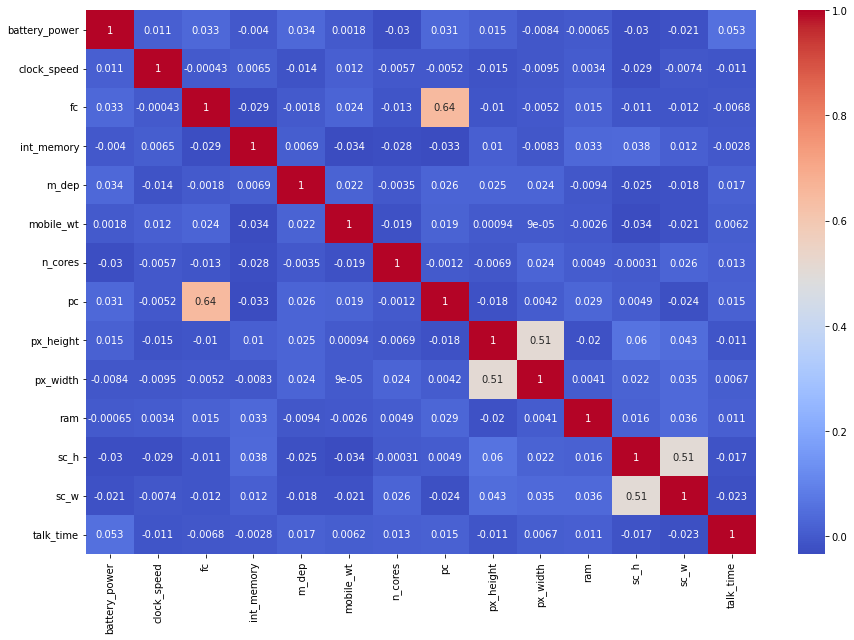

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(num_df.corr(),annot=True,cmap= 'coolwarm')

In [ ]:
# VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


In [ ]:
df1 = add_constant(num_df)


In [ ]:
# VIF of dataframe x
def vif(numerical_list):
# define vif that takes argument as list of columns
  x=df1[num_df.columns]
  a=pd.Series([(variance_inflation_factor(x.values,i)) for i in range(x.shape[1])], index=x.columns)
  return (a)
     

In [ ]:
df1.head()


,const,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
0,1.0,842,2.2,1,7,0.6,188,2,2,20,756,2549,9,7,19
1,1.0,1021,0.5,0,53,0.7,136,3,6,905,1988,2631,17,3,7
2,1.0,563,0.5,2,41,0.9,145,5,6,1263,1716,2603,11,2,9
3,1.0,615,2.5,0,10,0.8,131,6,9,1216,1786,2769,16,8,11
4,1.0,1821,1.2,13,44,0.6,141,2,14,1208,1212,1411,8,2,15


In [ ]:
vif(num_df)

battery_power     7.953793
clock_speed       4.230906
fc                3.406797
int_memory        3.929899
m_dep             3.901351
mobile_wt        12.526344
n_cores           4.593203
pc                6.217410
px_height         4.238915
px_width         11.561984
ram               4.620178
sc_h             11.360273
sc_w              3.714106
talk_time         4.835314
dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(x_transformed,y,test_size = 0.2, random_state = 2)
     


In [ ]:
X_train[0]

array([ 1.08548242,  1.0100505 , -0.56166326, -1.01918398, -0.67868074,
        0.95788598, -1.47878372,  0.39018536, -0.3707394 , -0.61809796,
        1.12055844, -0.42501115,  0.2958325 , -0.79093475, -1.76256598,
       -1.77432203,  0.91281961,  0.55964063,  0.99401789,  0.98609664])

In [ ]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

array([0.02131315, 0.01604775, 0.00309871, 0.00246142, 0.01279117,
       0.        , 0.        , 0.        , 0.00086253, 0.01834483,
       0.01083544, 0.03197362, 0.00522003, 0.83206259, 0.01248755,
       0.01832202, 0.        , 0.        , 0.00176452, 0.01265718])

In [ ]:
from sklearn.preprocessing import StandardScaler
scl = StandardScaler()
X_train_scaled = scl.fit_transform(X_train)
X_test_scaled = scl.transform(X_test)
X_scaled = scl.transform(x_transformed)
     

# **ML Models**

# **KNN**


In [ ]:
from sklearn.neighbors import  KNeighborsClassifier

ML(KNeighborsClassifier(n_neighbors= 60))
     

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7f3c5fb2d1f0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 584, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 725, in _make_controller_from_path
    lib_controller = lib_controller_class(
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 842, in __init__
    super().__init__(**kwargs)
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 810, in __init__
    self._dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.9/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: dlopen() error


cv_mean_score=0.6439999999999999


[CV] START .....................................................................
[CV] END ..................., score=(train=0.702, test=0.655) total time=   0.0s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] END ..................., score=(train=0.701, test=0.620) total time=   0.1s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV] END ..................., score=(train=0.692, test=0.667) total time=   0.2s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s remaining:    0.0s


[CV] END ..................., score=(train=0.706, test=0.645) total time=   0.0s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.0s remaining:    0.0s


[CV] END ..................., score=(train=0.696, test=0.632) total time=   0.0s
Cross validate scores={'fit_time': array([0.0014112 , 0.00135183, 0.00142169, 0.00115967, 0.00118852]), 'score_time': array([0.03229976, 0.11868525, 0.18048763, 0.0422771 , 0.03631711]), 'estimator': [KNeighborsClassifier(n_neighbors=60), KNeighborsClassifier(n_neighbors=60), KNeighborsClassifier(n_neighbors=60), KNeighborsClassifier(n_neighbors=60), KNeighborsClassifier(n_neighbors=60)], 'test_score': array([0.655 , 0.62  , 0.6675, 0.645 , 0.6325]), 'train_score': array([0.701875, 0.70125 , 0.691875, 0.70625 , 0.69625 ])}




Classification Report = 
               precision    recall  f1-score   support

           0       0.86      0.80      0.83       105
           1       0.52      0.66      0.58        87
           2       0.63      0.52      0.57       113
           3       0.74      0.77      0.75        95

    accuracy                           0.68       400
   macro avg       0.69      0.69 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.4s finished


In [ ]:
from sklearn.metrics import accuracy_score
accuracy =[]
for i in range(15,75):
  KNN = KNeighborsClassifier(n_neighbors= i)
  KNN.fit(X_train_scaled,y_train)
  y_pred_knn = KNN.predict(X_test_scaled)
  accuracy.append(accuracy_score(y_pred_knn,y_test))


In [ ]:
print(accuracy)

[0.6175, 0.6, 0.62, 0.645, 0.6375, 0.6325, 0.635, 0.615, 0.6275, 0.625, 0.615, 0.6225, 0.61, 0.6075, 0.625, 0.615, 0.62, 0.62, 0.6325, 0.6275, 0.6125, 0.61, 0.6275, 0.64, 0.645, 0.6325, 0.6475, 0.6525, 0.66, 0.6575, 0.65, 0.655, 0.645, 0.65, 0.65, 0.65, 0.6525, 0.665, 0.6675, 0.675, 0.6775, 0.6725, 0.6725, 0.6775, 0.6725, 0.6825, 0.6675, 0.67, 0.6775, 0.6625, 0.665, 0.67, 0.6775, 0.6625, 0.66, 0.6625, 0.67, 0.68, 0.68, 0.68]


## **Accuracy graph for different parameters of KNN**

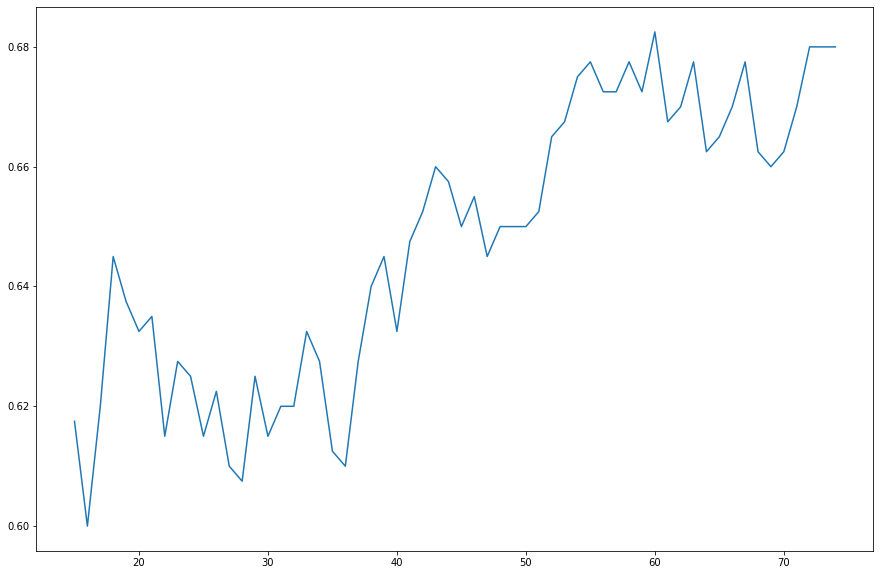

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(range(15,75),accuracy)

## **Support Vector Machine**

In [ ]:
from sklearn.svm import SVC
ML(SVC())

cv_mean_score=0.8775000000000001


[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ..................., score=(train=0.984, test=0.882) total time=   0.2s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV] END ..................., score=(train=0.984, test=0.853) total time=   0.1s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s remaining:    0.0s


[CV] END ..................., score=(train=0.986, test=0.912) total time=   0.1s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s remaining:    0.0s


[CV] END ..................., score=(train=0.988, test=0.868) total time=   0.1s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.0s remaining:    0.0s


[CV] END ..................., score=(train=0.983, test=0.873) total time=   0.1s
Cross validate scores={'fit_time': array([0.15312505, 0.07965517, 0.08015466, 0.08441186, 0.08083367]), 'score_time': array([0.04162192, 0.0266819 , 0.02786875, 0.03164983, 0.02612448]), 'estimator': [SVC(), SVC(), SVC(), SVC(), SVC()], 'test_score': array([0.8825, 0.8525, 0.9125, 0.8675, 0.8725]), 'train_score': array([0.984375, 0.98375 , 0.98625 , 0.9875  , 0.9825  ])}




Classification Report = 
               precision    recall  f1-score   support

           0       0.96      0.95      0.95        99
           1       0.85      0.88      0.87       106
           2       0.83      0.80      0.82        97
           3       0.92      0.93      0.92        98

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400



[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.2s finished


**Hyperparameter tunning for SVC**

In [ ]:
# parameter for Support Vector Classifier
svc_params = {'C':range(5,10,2),
              'kernel':['rbf','linear', 'poly', 'sigmoid',]}
# After finding the best parameters, we commented on all the other parameters for faster execution
     

In [ ]:
svc_grid = GridSearchCV(SVC(),param_grid=svc_params,cv=5,verbose=True,scoring='accuracy',n_jobs=-1)
svc_grid.fit(X_train,y_train)
     

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': range(5, 10, 2),
                         'kernel': ['rbf', 'linear', 'poly', 'sigmoid']},
             scoring='accuracy', verbose=True)

In [ ]:
svc_grid.best_params_

{'C': 5, 'kernel': 'linear'}

In [ ]:
ML(SVC(C= 5, kernel= 'linear'))

cv_mean_score=0.9540000000000001


[CV] START .....................................................................
[CV] END ..................., score=(train=0.969, test=0.960) total time=   0.1s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.971, test=0.955) total time=   0.1s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV] END ..................., score=(train=0.974, test=0.950) total time=   0.1s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.971, test=0.953) total time=   0.1s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.970, test=0.953) total time=   0.1s
Cross validate scores={'fit_time': array([0.06425405, 0.05298924, 0.05935979, 0.07542467, 0.06981182]), 'score_time': array([0.00314116, 0.00292873, 0.00349212, 0.00290799, 0.00301456]), 'estimator': [SVC(C=5, kernel='linear'), SVC(C=5, kernel='linear'), SVC(C=5, kernel='linear'), SVC(C=5, kernel='linear'), SVC(C=5, kernel='linear')], 'test_score': array([0.96  , 0.955 , 0.95  , 0.9525, 0.9525]), 'train_score': array([0.96875 , 0.97125 , 0.974375, 0.97125 , 0.97    ])}




Classification Report = 
               precision    recall  f1-score   support

           0       0.99      0.92   

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished


# **Decision Tree**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
ML(DecisionTreeClassifier())

cv_mean_score=0.8240000000000001


[CV] START .....................................................................
[CV] END ..................., score=(train=1.000, test=0.825) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=1.000, test=0.828) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=1.000, test=0.797) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=1.000, test=0.835) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=1.000, test=0.825) total time=   0.0s
Cross validate scores={'fit_time': array([0.01461434, 0.01411724, 0.0130372 , 0.01353908, 0.01354694]), 'score_time': array([0.00140762, 0.00134945, 0.0012

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished


**Feature selection for Decision Tree**

[Text(0.5, 1.0, 'Top 10 Important features for DecisionTreeClassifier()')]

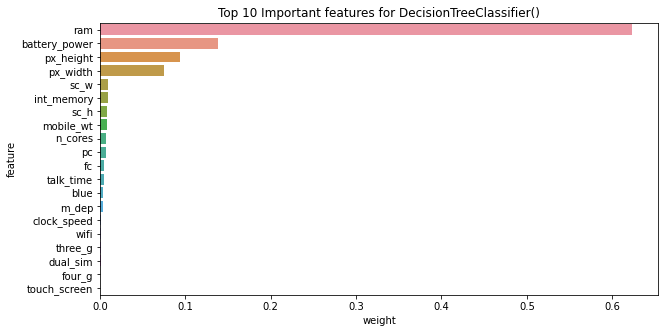

In [ ]:
DT = DecisionTreeClassifier()
DT.fit(X_train,y_train)
df5=pd.DataFrame({"feature":X.columns,"weight":DT.feature_importances_}).sort_values('weight',ascending=False).head(20)

plt.figure(figsize=(10,5))
    
sns.barplot(x=df5.weight,y=df5.feature).set(title=f'Top 10 Important features for {DT}')
     

**Hyperparameter tunning for decision tree**



In [ ]:
# Hyperparameter Tunning
# parameter = {'criterion' :['gini', 'entropy'],
#              'splitter' :['best', 'random'],
#              'max_depth' : [10,15,20,25,30,35,40,45,50,55,None],
#              'min_samples_split' : [3,2,4,5,10,15,25,30],
#              'min_samples_leaf' : [3,5,8,10,12],
#              }
# DT_tunning = GridSearchCV(DT,parameter,cv=5,n_jobs=-1)
# DT_tunning.fit(X_train,y_train)

     

In [ ]:
ML(DecisionTreeClassifier(criterion =  'entropy',max_depth= 45,min_samples_leaf= 5,min_samples_split= 10,splitter= 'best' ))

cv_mean_score=0.8450000000000001


[CV] START .....................................................................
[CV] END ..................., score=(train=0.961, test=0.860) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.953, test=0.853) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.953, test=0.853) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.957, test=0.823) total time=   0.0s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.953, test=0.850) total time=   0.0s
Cross validate scores={'fit_time': array([0.01078463, 0.01100945, 0.01870728, 0.0122838 , 0.01095104]), 'score_time': array([0.00077081, 0.00079608, 0.0014

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished


# **Bagging**

In [ ]:
from sklearn.ensemble  import  BaggingClassifier
ML(BaggingClassifier())
     

cv_mean_score=0.8815


[CV] START .....................................................................
[CV] END ..................., score=(train=0.996, test=0.880) total time=   0.1s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.995, test=0.865) total time=   0.1s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV] END ..................., score=(train=0.992, test=0.907) total time=   0.1s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.994, test=0.855) total time=   0.1s
[CV] START .....................................................................
[CV] END ..................., score=(train=0.994, test=0.868) total time=   0.1s
Cross validate scores={'fit_time': array([0.08307433, 0.08390474, 0.08449197, 0.08695436, 0.08259463]), 'score_time': array([0.00260043, 0.002635  , 0.00321436, 0.0025022 , 0.00255919]), 'estimator': [BaggingClassifier(), BaggingClassifier(), BaggingClassifier(), BaggingClassifier(), BaggingClassifier()], 'test_score': array([0.88  , 0.865 , 0.9075, 0.855 , 0.8675]), 'train_score': array([0.99625 , 0.995   , 0.991875, 0.99375 , 0.994375])}




Classification Report = 
               precision    recall  f1-score   support

           0       0.95      0.88      0.91       106
           1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s finished


### **Hyperparameter tunning for Bagging**

In [ ]:
# BC = BaggingClassifier()
# LR = LogisticRegression()
# GBC = GradientBoostingClassifier()
# RFC = RandomForestClassifier()

# params = {'base_estimator':[LR,GBC,RFC], 'n_estimators' : [20,50,100], 'max_samples' : [0.2,0.5,0.8,1.0],
#           'bootstrap': [True,False],'bootstrap_features': [True,False], 'max_features':[0.2,0.5,0.7,1.0]}

# Bagging_tunning = RandomizedSearchCV(BaggingClassifier(n_jobs=-1),params,cv=5,n_jobs=-1) 
# Bagging_tunning.fit(X_train,y_train)          
# Bagging_tunning.best_params_     
     

In [ ]:
ML(BaggingClassifier(base_estimator= LogisticRegression(),
 bootstrap= True,
 bootstrap_features= True,
 max_features= 1.0,
 max_samples= 0.8,
 n_estimators= 20))

cv_mean_score=0.9199999999999999


[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ..................., score=(train=0.949, test=0.943) total time=   0.3s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV] END ..................., score=(train=0.931, test=0.900) total time=   0.3s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s remaining:    0.0s


[CV] END ..................., score=(train=0.932, test=0.915) total time=   0.3s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s remaining:    0.0s


[CV] END ..................., score=(train=0.941, test=0.950) total time=   0.4s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.4s remaining:    0.0s


[CV] END ..................., score=(train=0.948, test=0.940) total time=   0.4s
Cross validate scores={'fit_time': array([0.31310606, 0.32078791, 0.27655029, 0.38085985, 0.37477422]), 'score_time': array([0.00513887, 0.00465298, 0.00492072, 0.0061233 , 0.00609732]), 'estimator': [BaggingClassifier(base_estimator=LogisticRegression(), bootstrap_features=True,
                  max_samples=0.8, n_estimators=20), BaggingClassifier(base_estimator=LogisticRegression(), bootstrap_features=True,
                  max_samples=0.8, n_estimators=20), BaggingClassifier(base_estimator=LogisticRegression(), bootstrap_features=True,
                  max_samples=0.8, n_estimators=20), BaggingClassifier(base_estimator=LogisticRegression(), bootstrap_features=True,
                  max_samples=0.8, n_estimators=20), BaggingClassifier(base_estimator=LogisticRegression(), bootstrap_features=True,
                  max_samples=0.8, n_estimators=20)], 'test_score': array([0.9425, 0.9   , 0.915 , 0.95  ,

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.8s finished


Random Forest

**Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
ML(RandomForestClassifier())

cv_mean_score=0.8695


[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ..................., score=(train=1.000, test=0.870) total time=   0.3s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.880) total time=   0.4s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.8s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.882) total time=   0.4s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.868) total time=   0.5s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.8s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.873) total time=   0.5s
Cross validate scores={'fit_time': array([0.33417797, 0.39474416, 0.43098783, 0.44780684, 0.43928051]), 'score_time': array([0.01450086, 0.02270794, 0.01840568, 0.02471304, 0.01868296]), 'estimator': [RandomForestClassifier(), RandomForestClassifier(), RandomForestClassifier(), RandomForestClassifier(), RandomForestClassifier()], 'test_score': array([0.87  , 0.88  , 0.8825, 0.8675, 0.8725]), 'train_score': array([1., 1., 1., 1., 1.])}




Classification Report = 
               precision    recall  f1-score   support

           0       0.96      0.89      0.92       106
           1       0.83      0.87      0.85       103
           2       0.83      0.89      0.86        88
           3       0.97      0.93      0.95       103

    accuracy                           0.90       400
   macro avg       0.90      0.89      0.89       400
weighted avg       0.90      0.90      0.90       400



[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.3s finished


**Gradient Boosting**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
ML(GradientBoostingClassifier())
     

cv_mean_score=0.9004999999999999


[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ..................., score=(train=1.000, test=0.895) total time=   2.0s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.915) total time=   2.0s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.1s remaining:    0.0s


[CV] END ..................., score=(train=0.999, test=0.900) total time=   2.4s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.5s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.900) total time=   2.7s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    9.2s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.890) total time=   2.6s
Cross validate scores={'fit_time': array([2.01037216, 2.01335502, 2.36777973, 2.69577503, 2.64116788]), 'score_time': array([0.00425005, 0.00432038, 0.00450945, 0.00515842, 0.0042119 ]), 'estimator': [GradientBoostingClassifier(), GradientBoostingClassifier(), GradientBoostingClassifier(), GradientBoostingClassifier(), GradientBoostingClassifier()], 'test_score': array([0.895, 0.915, 0.9  , 0.9  , 0.89 ]), 'train_score': array([1.     , 1.     , 0.99875, 1.     , 1.     ])}




Classification Report = 
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       105
           1       0.89      0.92      0.90       106
           2       0.90      0.92      0.91        92
           3       0.94      0.96      0.95        97

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   11.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   11.8s finished


**XGBoost**

In [ ]:
!pip3 install xgboost
     

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import xgboost

In [ ]:
from xgboost import XGBClassifier

ML(XGBClassifier())

cv_mean_score=0.9129999999999999


[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ..................., score=(train=1.000, test=0.912) total time=   0.6s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.927) total time=   0.6s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.925) total time=   0.6s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.905) total time=   0.6s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.5s remaining:    0.0s


[CV] END ..................., score=(train=1.000, test=0.895) total time=   0.6s
Cross validate scores={'fit_time': array([0.57140398, 0.60575986, 0.60008669, 0.60329175, 0.60441947]), 'score_time': array([0.00460005, 0.00478625, 0.00471902, 0.0047276 , 0.00489521]), 'estimator': [XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              object

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.1s finished


**Hyperparameter tunning for XGBoost**

In [ ]:
## Hyper Parameter Optimization

# params={
#  "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
#  "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
#  "min_child_weight" : [ 1, 3, 5, 7 ],
#  "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
#  "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
    
# }

In [ ]:
XGB = xgboost.XGBClassifier()

In [ ]:
#XGB = XGBClassifier()
# random_search= RandomizedSearchCV(XGB,param_distributions=params,n_iter=5,scoring='accuracy',n_jobs=-1,cv=5,verbose=3)
# random_search.fit(X_train,y_train)
     

In [ ]:
# random_search.best_estimator_
     


**Voting**

In [ ]:
# Base Estimators 
estimators = [('DT',DecisionTreeClassifier()),('RF',RandomForestClassifier()),
       ('GB',GradientBoostingClassifier()),('LR',LogisticRegression()),
       ]
     


In [ ]:
from sklearn.ensemble  import  VotingClassifier
from sklearn.neighbors import  KNeighborsClassifier
from sklearn.svm import SVC
dt=DecisionTreeClassifier(criterion =  'entropy',max_depth= 45,min_samples_leaf= 5,min_samples_split= 10,splitter= 'best' )
xgb = XGBClassifier
sc = StackingClassifier(estimators=estimators,final_estimator=SVC,passthrough=True,n_jobs=-1)
gbc=GradientBoostingClassifier()
xbg_ = XGBClassifier(colsample_bytree= 0.7,
 gamma= 0.3,
 learning_rate= 0.25,
 max_depth= 15,
 min_child_weight= 3,
 objective='multi:softprob')
bc = BaggingClassifier(base_estimator= LogisticRegression(),
 bootstrap= True,
 bootstrap_features= True,
 max_features= 1.0,
 max_samples= 0.8,
 n_estimators= 20)
estimator=[('gbc',gbc),('bc',bc),('dt',dt)]

ML(VotingClassifier(estimators=estimator))
     


cv_mean_score=0.9105000000000001


[CV] START .....................................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ..................., score=(train=0.992, test=0.925) total time=   2.3s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s remaining:    0.0s


[CV] END ..................., score=(train=0.989, test=0.925) total time=   2.3s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.7s remaining:    0.0s


[CV] END ..................., score=(train=0.984, test=0.905) total time=   2.9s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.6s remaining:    0.0s


[CV] END ..................., score=(train=0.988, test=0.910) total time=   2.5s
[CV] START .....................................................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   10.1s remaining:    0.0s


[CV] END ..................., score=(train=0.986, test=0.907) total time=   2.8s
Cross validate scores={'fit_time': array([2.28040266, 2.28422999, 2.87313128, 2.47987914, 2.81831861]), 'score_time': array([0.011379  , 0.01039839, 0.01388025, 0.0163331 , 0.01555634]), 'estimator': [VotingClassifier(estimators=[('gbc', GradientBoostingClassifier()),
                             ('bc',
                              BaggingClassifier(base_estimator=LogisticRegression(),
                                                bootstrap_features=True,
                                                max_samples=0.8,
                                                n_estimators=20)),
                             ('dt',
                              DecisionTreeClassifier(criterion='entropy',
                                                     max_depth=45,
                                                     min_samples_leaf=5,
                                                     min_samples_split=10)

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   13.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   13.0s finished


**Hyperparameter tunning for Voting**

In [ ]:
# hyperparameter tunning of voting

# from sklearn.model_selection import cross_val_score
# for i in range(1,5):
#   for j in range(1,5):
#     for k in range(1,5):
#       for l in range(1,5):
#       # mean cross_val_score for Voting
#        vr=VotingClassifier(estimators=estimator,weights=[i,j,k,l])
#        score = cross_val_score(vr,x_transformed,df['price_range'],scoring='accuracy',cv= 10)
#        print(f'for ({i},{j},{k},{l}) vr mean_cv_score={np.mean(score)}')
     

**Stacking**

In [ ]:
# import stacking regressor from sklearn ensemble
from sklearn.ensemble import StackingClassifier
     